Suggestions:

- Create a folder named "Week 5"

- Inside the folder, create another folder named "data"

- Save the image 'pic1.jpg' to the "data" folder. 

%cd to your "Week 5" folder

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
%cd '/content/drive/MyDrive/L5'
%ls

/content/drive/MyDrive/L5
'Cher Eng Lim - pic1.jpg'  'Cher Eng Lim - test_image.jpeg'


In [ ]:
import os 
from tensorflow.keras.preprocessing.image import ImageDataGenerator, img_to_array, load_img

%matplotlib inline 
import matplotlib.pyplot as plt

import numpy as np

In [ ]:
def generate_plot_pics(datagen, orig_img, num_of_image):
  
    # create a folder to store synthesized images
    dir_augmented_data = "synthesized data"
    try:
       os.mkdir(dir_augmented_data)
    except:
        for item in os.listdir(dir_augmented_data):
            os.remove(dir_augmented_data + "/" + item)

    # convert the original image to array
    x = img_to_array(orig_img)
    # reshape --> (1, Nrow, Ncol, 3) 
    x = x.reshape((1,) + x.shape)


    i = 0
    # This for-loop would run forever without break
    # When we have created enough images (num_of_image), we would break out
    for batch in datagen.flow(x, batch_size = 1,
                          save_to_dir = dir_augmented_data,
                          save_prefix = "pic",
                          save_format = 'jpeg'):
        i += 1
        if i > num_of_image - 1:
            break

    # plot the generated images
    fig = plt.figure(figsize = (3*np.sqrt(num_of_image+1), 3*np.sqrt(num_of_image+1)))
    fig.subplots_adjust(hspace = 0.02, wspace = 0.01, left = 0,right = 1, bottom = 0, top = 1)

    # original image
    ax = fig.add_subplot(np.sqrt(num_of_image+1), np.sqrt(num_of_image+1), 1, xticks = [], yticks = [])        
    ax.imshow(orig_img)
    ax.set_title("original")

    i = 2
    for imgnm in os.listdir(dir_augmented_data):
        ax = fig.add_subplot(np.sqrt(num_of_image+1), np.sqrt(num_of_image+1), i, xticks = [], yticks = []) 
        img = load_img(dir_augmented_data + "/" + imgnm)
        ax.imshow(img)
        i += 1
    plt.show()

In [ ]:
orig_img = load_img("Cher Eng Lim - pic1.jpg") 

# rotation_range

rotation_range: Int. Degree range for random rotations.

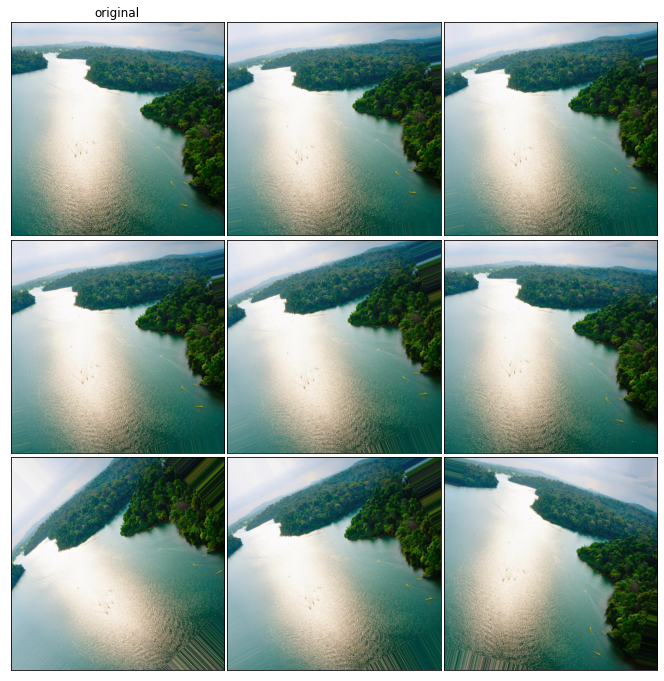

In [ ]:
datagen = ImageDataGenerator(rotation_range = 45)
generate_plot_pics(datagen, orig_img, num_of_image = 8)

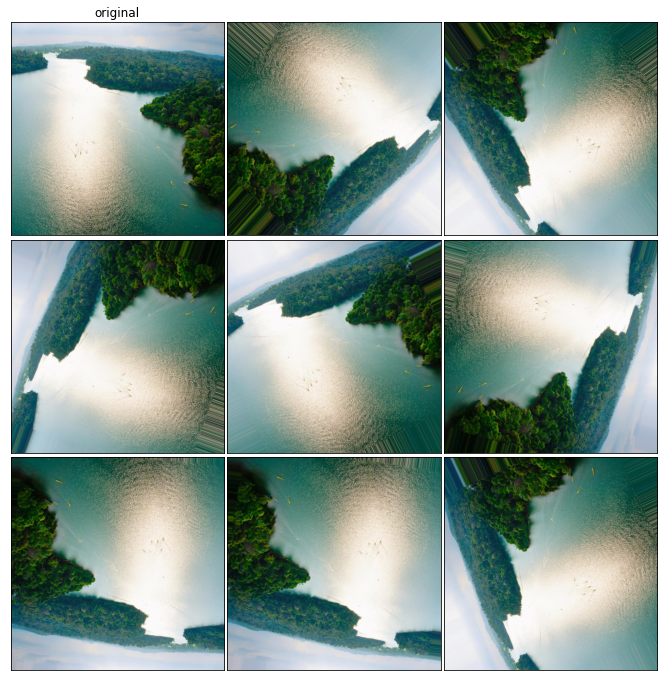

In [ ]:
datagen = ImageDataGenerator(rotation_range = 180)
generate_plot_pics(datagen, orig_img, num_of_image = 8)

# width_shift_range

width_shift_range: Float (fraction of total width). Range for random horizontal shifts.

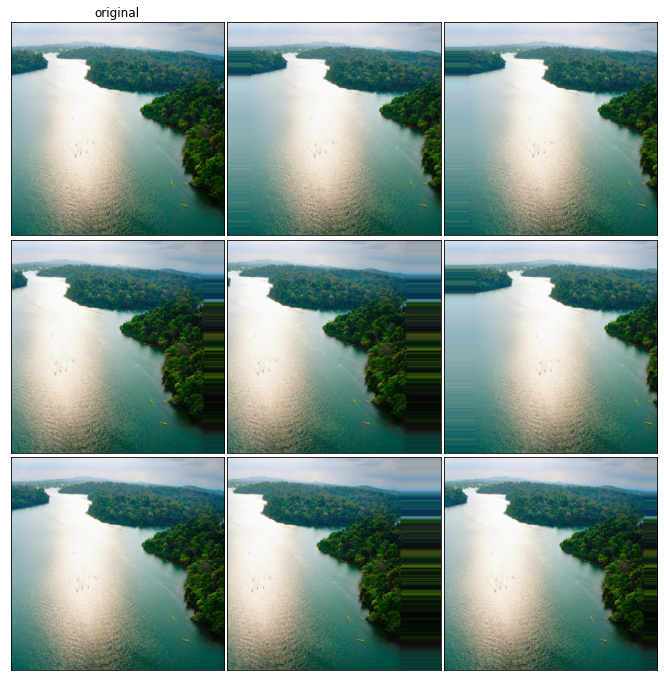

In [ ]:
datagen = ImageDataGenerator(width_shift_range = 0.25)
generate_plot_pics(datagen, orig_img, num_of_image = 8)

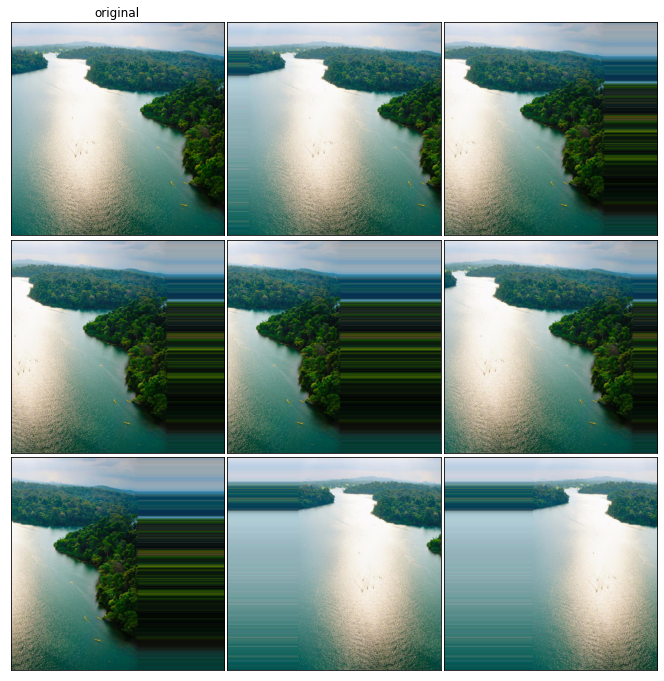

In [ ]:
datagen = ImageDataGenerator(width_shift_range = 0.5)
generate_plot_pics(datagen, orig_img, num_of_image = 8)

How the void space is filled after the image is shifted? 

`fill_mode: One of {"constant", "nearest", "reflect" or "wrap"}. Default is 'nearest'. Points outside the boundaries of the input are filled according to the given mode: - 'constant': kkkkkkkk|abcd|kkkkkkkk (cval=k) - 'nearest': aaaaaaaa|abcd|dddddddd - 'reflect': abcddcba|abcd|dcbaabcd - 'wrap': abcdabcd|abcd|abcdabcd`

# height_shift_range

height_shift_range: Float (fraction of total height). Range for random vertical shifts.

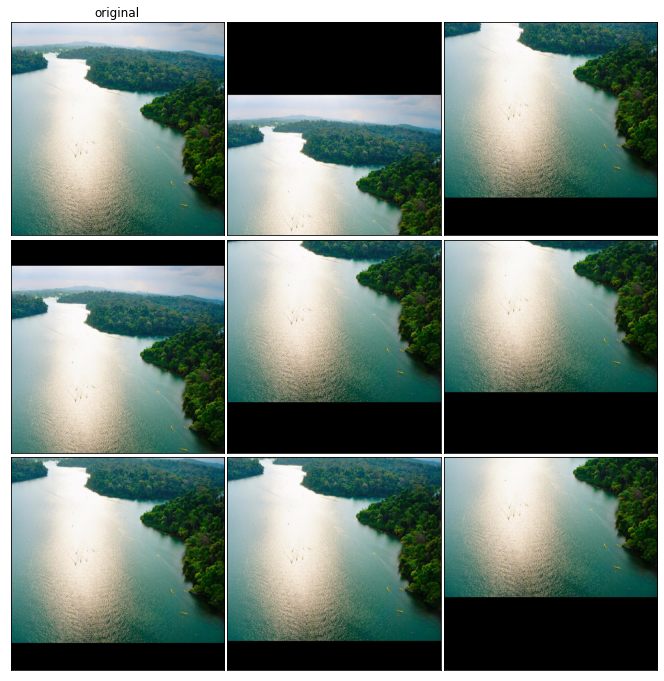

In [ ]:
datagen = ImageDataGenerator(height_shift_range = 0.5, fill_mode = "constant")
generate_plot_pics(datagen, orig_img, num_of_image = 8)

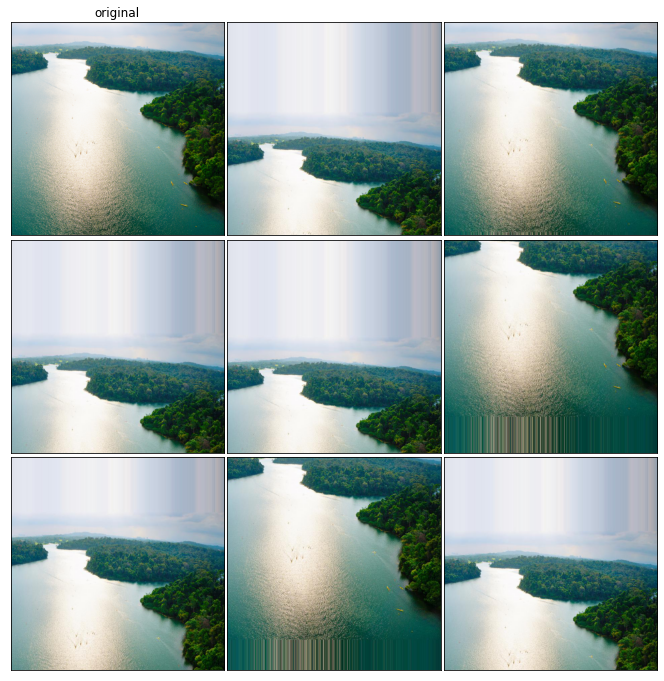

In [ ]:
datagen = ImageDataGenerator(height_shift_range = 0.5, fill_mode = "nearest")
generate_plot_pics(datagen, orig_img, num_of_image = 8)

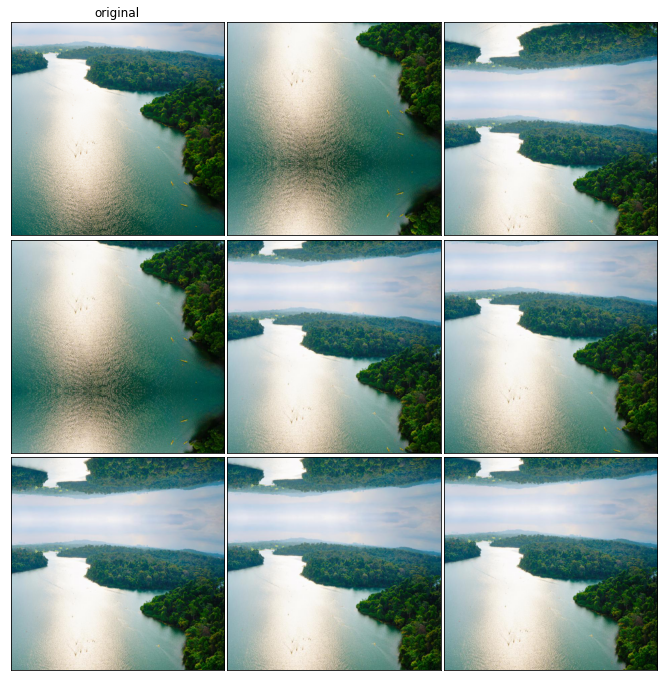

In [ ]:
datagen = ImageDataGenerator(height_shift_range = 0.5, fill_mode = "reflect")
generate_plot_pics(datagen, orig_img, num_of_image = 8)

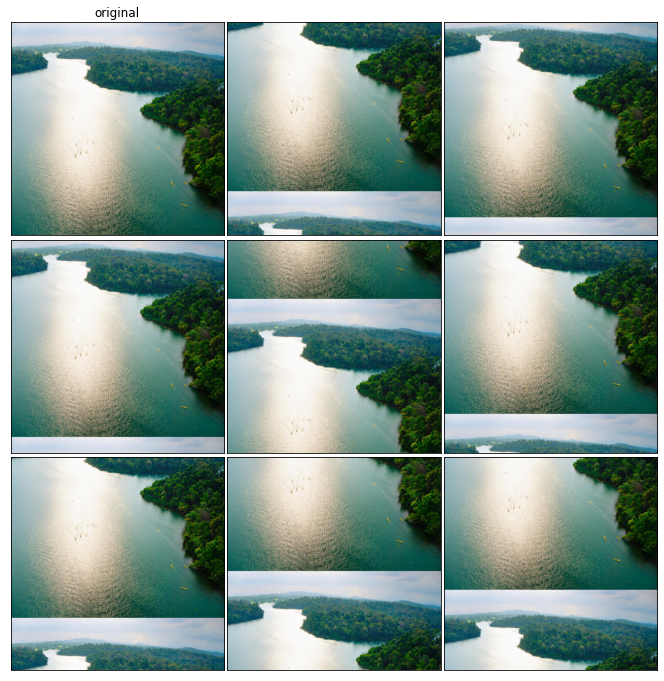

In [ ]:
datagen = ImageDataGenerator(height_shift_range = 0.5, fill_mode = "wrap")
generate_plot_pics(datagen, orig_img, num_of_image = 8)

# horizontal_flip

horizontal_flip: Boolean. Randomly flip inputs horizontally.

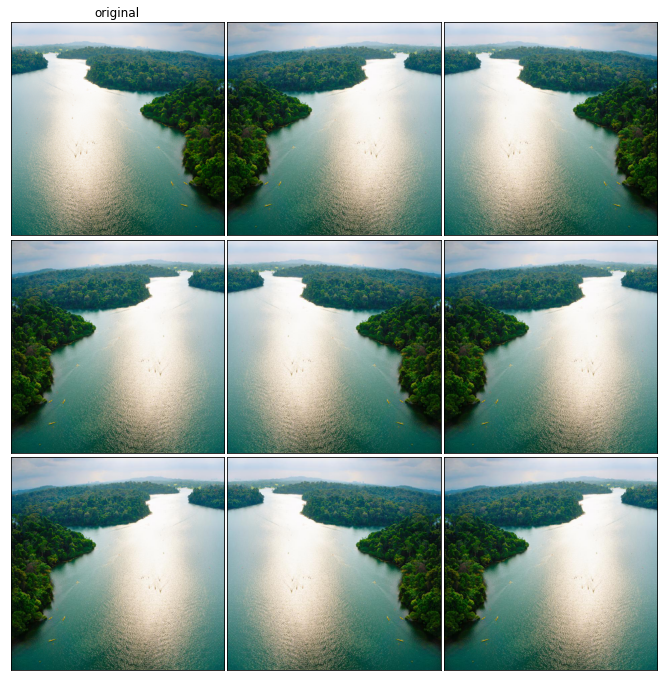

In [ ]:
datagen = ImageDataGenerator(horizontal_flip = True)
generate_plot_pics(datagen, orig_img, num_of_image = 8)

# vertical_flip

vertical_flip: Boolean. Randomly flip inputs vertically.

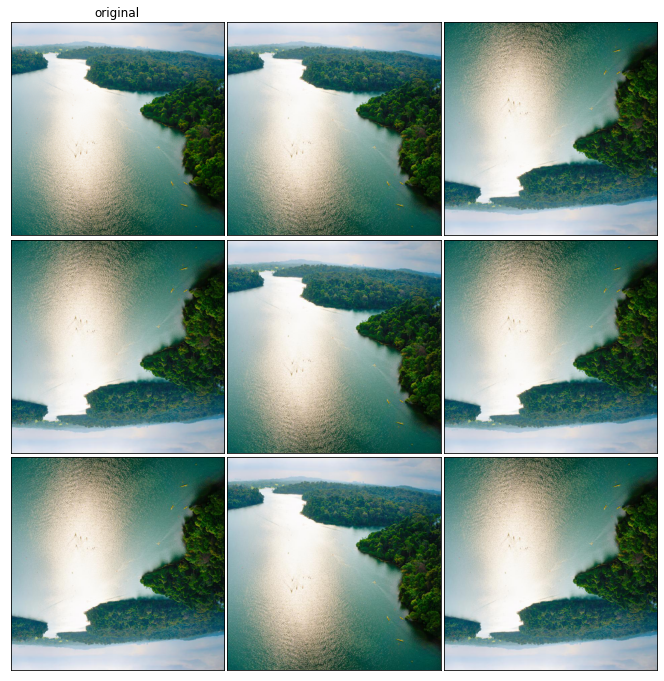

In [ ]:
datagen = ImageDataGenerator(vertical_flip = True)
generate_plot_pics(datagen, orig_img, num_of_image = 8)

# shear_range

shear_range: Float. Shear Intensity (Shear angle in counter-clockwise direction in degrees)

This transformation basically deforms the image by an angle ($\gamma$) in the below picture.

![picture](https://drive.google.com/uc?id=1yaGSRVBaZvhkpSekzhJrWIq9rZLyOgh7)



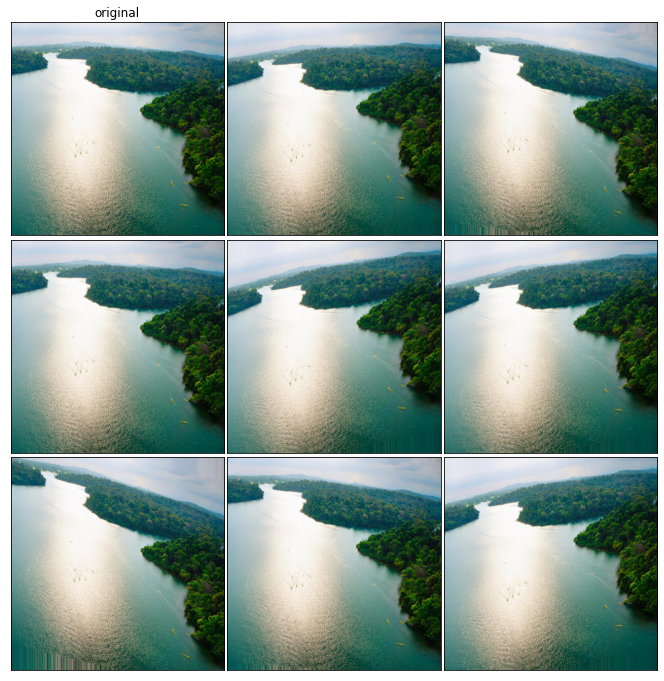

In [ ]:
datagen = ImageDataGenerator(shear_range = 20)
generate_plot_pics(datagen, orig_img, num_of_image = 8)

# zoom_range

zoom_range: Float or `[lower, upper]`. Range for random zoom. If a float,  `[lower, upper] = [1-zoom_range, 1+zoom_range]`.

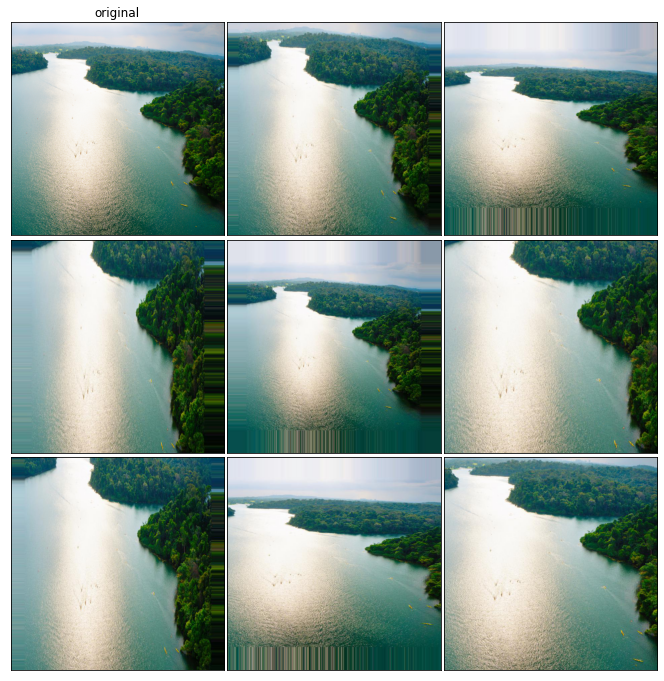

In [ ]:
datagen = ImageDataGenerator(zoom_range = 0.5)
generate_plot_pics(datagen, orig_img, num_of_image = 8)

#Combine everything together!

In [ ]:
datagen = ImageDataGenerator(rotation_range = 45,
                             width_shift_range = 0.25,
                             height_shift_range = 0.5,
                             fill_mode = "nearest",
                             horizontal_flip = True,
                             vertical_flip = True,
                             shear_range = 20,
                             zoom_range = 0.2
                             )

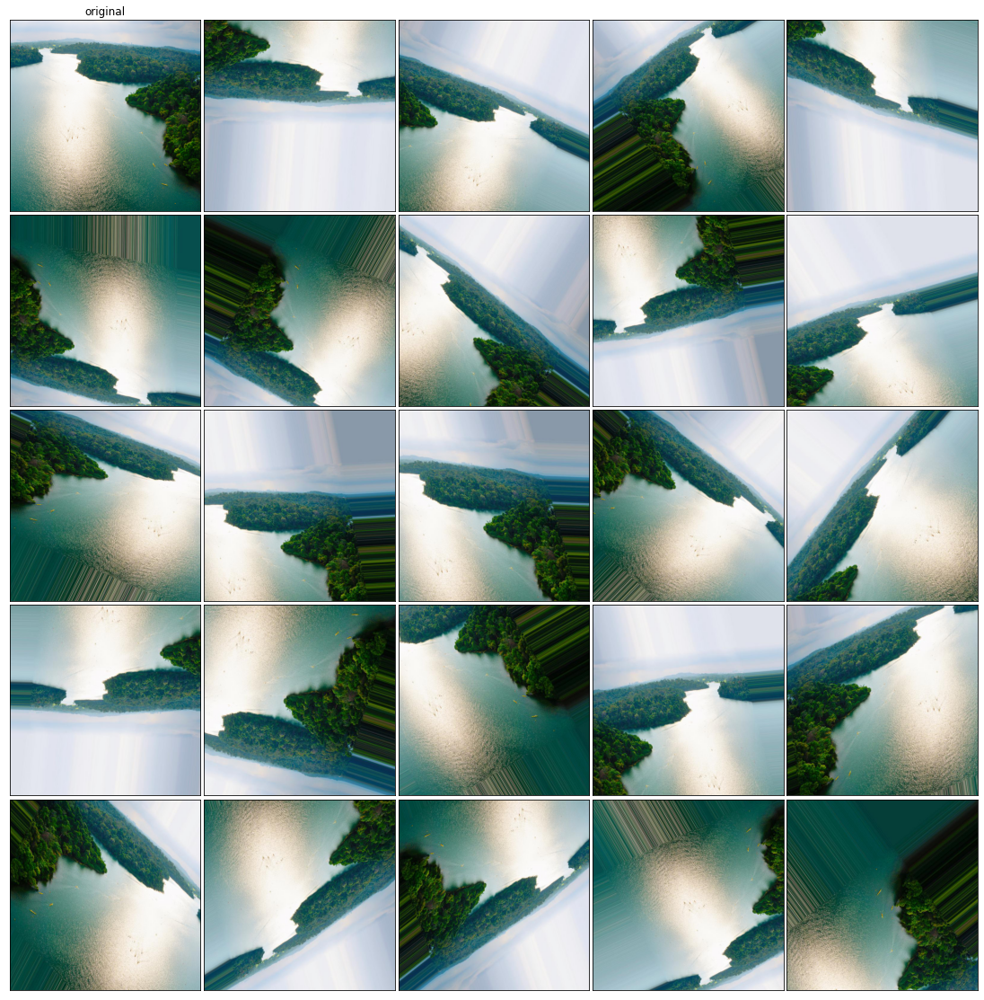

In [ ]:
generate_plot_pics(datagen, orig_img, num_of_image = 24)